In [1]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [2]:
#Importation et affichage du dataset
df=pd.read_excel("superstore_sales.xlsx")

df

,order_id,order_date,ship_date,ship_mode,customer_name,segment,state,country,market,region,...,category,sub_category,product_name,sales,quantity,discount,profit,shipping_cost,order_priority,year
0,AG-2011-2040,2011-01-01,2011-01-06,Standard Class,Toby Braunhardt,Consumer,Constantine,Algeria,Africa,Africa,...,Office Supplies,Storage,"Tenex Lockers, Blue",408.300,2,0.0,106.1400,35.460,Medium,2011
1,IN-2011-47883,2011-01-01,2011-01-08,Standard Class,Joseph Holt,Consumer,New South Wales,Australia,APAC,Oceania,...,Office Supplies,Supplies,"Acme Trimmer, High Speed",120.366,3,0.1,36.0360,9.720,Medium,2011
2,HU-2011-1220,2011-01-01,2011-01-05,Second Class,Annie Thurman,Consumer,Budapest,Hungary,EMEA,EMEA,...,Office Supplies,Storage,"Tenex Box, Single Width",66.120,4,0.0,29.6400,8.170,High,2011
3,IT-2011-3647632,2011-01-01,2011-01-05,Second Class,Eugene Moren,Home Office,Stockholm,Sweden,EU,North,...,Office Supplies,Paper,"Enermax Note Cards, Premium",44.865,3,0.5,-26.0550,4.820,High,2011
4,IN-2011-47883,2011-01-01,2011-01-08,Standard Class,Joseph Holt,Consumer,New South Wales,Australia,APAC,Oceania,...,Furniture,Furnishings,"Eldon Light Bulb, Duo Pack",113.670,5,0.1,37.7700,4.700,Medium,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,CA-2014-115427,2014-12-31,2015-01-04,Standard Class,Erica Bern,Corporate,California,United States,US,West,...,Office Supplies,Binders,"Cardinal Slant-D Ring Binder, Heavy Gauge Vinyl",13.904,2,0.2,4.5188,0.890,Medium,2014
51286,MO-2014-2560,2014-12-31,2015-01-05,Standard Class,Liz Preis,Consumer,Souss-Massa-Draâ,Morocco,Africa,Africa,...,Office Supplies,Binders,"Wilson Jones Hole Reinforcements, Clear",3.990,1,0.0,0.4200,0.490,Medium,2014
51287,MX-2014-110527,2014-12-31,2015-01-02,Second Class,Charlotte Melton,Consumer,Managua,Nicaragua,LATAM,Central,...,Office Supplies,Labels,"Hon Color Coded Labels, 5000 Label Set",26.400,3,0.0,12.3600,0.350,Medium,2014
51288,MX-2014-114783,2014-12-31,2015-01-06,Standard Class,Tamara Dahlen,Consumer,Chihuahua,Mexico,LATAM,North,...,Office Supplies,Labels,"Hon Legal Exhibit Labels, Alphabetical",7.120,1,0.0,0.5600,0.199,Medium,2014


In [3]:
#Il n'y a aucune valeur manquante et les données sont au bon format 
#La variable year pourrait etre aussi en datetime64, mais, la considerer comme int ne nous derangera pas dans l'analyse
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   order_id        51290 non-null  object        
 1   order_date      51290 non-null  datetime64[ns]
 2   ship_date       51290 non-null  datetime64[ns]
 3   ship_mode       51290 non-null  object        
 4   customer_name   51290 non-null  object        
 5   segment         51290 non-null  object        
 6   state           51290 non-null  object        
 7   country         51290 non-null  object        
 8   market          51290 non-null  object        
 9   region          51290 non-null  object        
 10  product_id      51290 non-null  object        
 11  category        51290 non-null  object        
 12  sub_category    51290 non-null  object        
 13  product_name    51290 non-null  object        
 14  sales           51290 non-null  float64       
 15  qu

In [4]:
#On a une vue d'ensemble des caracteristiques des variables
#Ça nous permet de répondre à des questions comme "le mode d'expédition préféré des clients" ou "le produit le plus vendu"
df.describe(include='all')

,order_id,order_date,ship_date,ship_mode,customer_name,segment,state,country,market,region,...,category,sub_category,product_name,sales,quantity,discount,profit,shipping_cost,order_priority,year
count,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,...,51290,51290,51290,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290,51290.000000
unique,25035,NaN,NaN,4,795,3,1094,147,7,13,...,3,17,3788,NaN,NaN,NaN,NaN,NaN,4,NaN
top,CA-2014-100111,NaN,NaN,Standard Class,Muhammed Yedwab,Consumer,California,United States,APAC,Central,...,Office Supplies,Binders,Staples,NaN,NaN,NaN,NaN,NaN,Medium,NaN
freq,14,NaN,NaN,30775,108,26518,2001,9994,11002,11117,...,31273,6152,227,NaN,NaN,NaN,NaN,NaN,29433,NaN
mean,NaN,2013-05-11 21:26:49.155780864,2013-05-15 20:42:42.745174528,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,246.490581,3.476545,0.142908,28.641740,26.375818,NaN,2012.777208
min,NaN,2011-01-01 00:00:00,2011-01-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.444000,1.000000,0.000000,-6599.978000,0.002000,NaN,2011.000000
25%,NaN,2012-06-19 00:00:00,2012-06-23 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,30.758625,2.000000,0.000000,0.000000,2.610000,NaN,2012.000000
50%,NaN,2013-07-08 00:00:00,2013-07-12 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,85.053000,3.000000,0.000000,9.240000,7.790000,NaN,2013.000000
75%,NaN,2014-05-22 00:00:00,2014-05-26 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,251.053200,5.000000,0.200000,36.810000,24.450000,NaN,2014.000000
max,NaN,2014-12-31 00:00:00,2015-01-07 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,22638.480000,14.000000,0.850000,8399.976000,933.570000,NaN,2014.000000


In [5]:
#On regarde uniquement les variables quantitatives
df.select_dtypes(np.number)

,sales,quantity,discount,profit,shipping_cost,year
0,408.300,2,0.0,106.1400,35.460,2011
1,120.366,3,0.1,36.0360,9.720,2011
2,66.120,4,0.0,29.6400,8.170,2011
3,44.865,3,0.5,-26.0550,4.820,2011
4,113.670,5,0.1,37.7700,4.700,2011
...,...,...,...,...,...,...
51285,13.904,2,0.2,4.5188,0.890,2014
51286,3.990,1,0.0,0.4200,0.490,2014
51287,26.400,3,0.0,12.3600,0.350,2014
51288,7.120,1,0.0,0.5600,0.199,2014


In [6]:
#Prix maximum de vente des articles
df['sales'].max()

22638.48

In [7]:
df['sales']

0        408.300
1        120.366
2         66.120
3         44.865
4        113.670
          ...   
51285     13.904
51286      3.990
51287     26.400
51288      7.120
51289      3.024
Name: sales, Length: 51290, dtype: float64

In [8]:
#Prix minimum de vente des articles
df['sales'].min()

0.44399999999999995

In [9]:
#On regarde uniquement les variables catégorielles
df.select_dtypes(exclude=np.number)

,order_id,order_date,ship_date,ship_mode,customer_name,segment,state,country,market,region,product_id,category,sub_category,product_name,order_priority
0,AG-2011-2040,2011-01-01,2011-01-06,Standard Class,Toby Braunhardt,Consumer,Constantine,Algeria,Africa,Africa,OFF-TEN-10000025,Office Supplies,Storage,"Tenex Lockers, Blue",Medium
1,IN-2011-47883,2011-01-01,2011-01-08,Standard Class,Joseph Holt,Consumer,New South Wales,Australia,APAC,Oceania,OFF-SU-10000618,Office Supplies,Supplies,"Acme Trimmer, High Speed",Medium
2,HU-2011-1220,2011-01-01,2011-01-05,Second Class,Annie Thurman,Consumer,Budapest,Hungary,EMEA,EMEA,OFF-TEN-10001585,Office Supplies,Storage,"Tenex Box, Single Width",High
3,IT-2011-3647632,2011-01-01,2011-01-05,Second Class,Eugene Moren,Home Office,Stockholm,Sweden,EU,North,OFF-PA-10001492,Office Supplies,Paper,"Enermax Note Cards, Premium",High
4,IN-2011-47883,2011-01-01,2011-01-08,Standard Class,Joseph Holt,Consumer,New South Wales,Australia,APAC,Oceania,FUR-FU-10003447,Furniture,Furnishings,"Eldon Light Bulb, Duo Pack",Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,CA-2014-115427,2014-12-31,2015-01-04,Standard Class,Erica Bern,Corporate,California,United States,US,West,OFF-BI-10002103,Office Supplies,Binders,"Cardinal Slant-D Ring Binder, Heavy Gauge Vinyl",Medium
51286,MO-2014-2560,2014-12-31,2015-01-05,Standard Class,Liz Preis,Consumer,Souss-Massa-Draâ,Morocco,Africa,Africa,OFF-WIL-10001069,Office Supplies,Binders,"Wilson Jones Hole Reinforcements, Clear",Medium
51287,MX-2014-110527,2014-12-31,2015-01-02,Second Class,Charlotte Melton,Consumer,Managua,Nicaragua,LATAM,Central,OFF-LA-10004182,Office Supplies,Labels,"Hon Color Coded Labels, 5000 Label Set",Medium
51288,MX-2014-114783,2014-12-31,2015-01-06,Standard Class,Tamara Dahlen,Consumer,Chihuahua,Mexico,LATAM,North,OFF-LA-10000413,Office Supplies,Labels,"Hon Legal Exhibit Labels, Alphabetical",Medium


In [10]:
#On regroupe les ventes par années puis on fait la somme des quantités vendues
ventes_par_annee = df.groupby('year')['quantity'].sum()

In [11]:
#On voit ici que les ventes augmentent au fil des années. On va l'illustrer dans un graphique
ventes_par_annee

year
2011    31443
2012    38111
2013    48136
2014    60622
Name: quantity, dtype: int64

Dans le graphique ci dessous on remarque une augmentation croissante des ventes au fil des annees 

<Axes: xlabel='year', ylabel='quantity'>

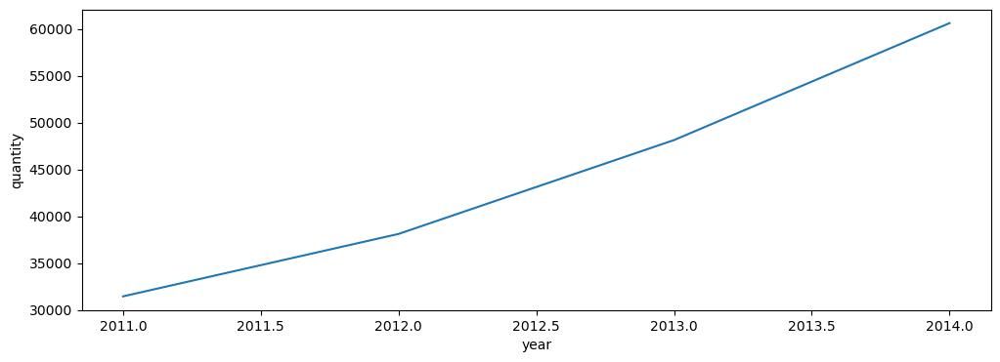

In [12]:
plt.figure(figsize=(12, 4))
sns.lineplot(data=ventes_par_annee, x='year', y=ventes_par_annee)

In [13]:
sales_par_produit = df.groupby('product_name')['sales'].sum()

In [14]:
sales_par_produit

product_name
"While you Were Out" Message Book, One Form per Page                                                     25.228
#10 Gummed Flap White Envelopes, 100/Box                                                                 41.300
#10 Self-Seal White Envelopes                                                                           108.682
#10 White Business Envelopes,4 1/8 x 9 1/2                                                              488.904
#10- 4 1/8" x 9 1/2" Recycled Envelopes                                                                 286.672
                                                                                                         ...   
iKross Bluetooth Portable Keyboard + Cell Phone Stand Holder + Brush for Apple iPhone 5S 5C 5, 4S 4     477.660
iOttie HLCRIO102 Car Mount                                                                              215.892
iOttie XL Car Mount                                                                        

In [15]:
#Les dix (10) premiers produits par vente

ten_bests=sales_par_produit.nlargest(10)
ten_bests

product_name
Apple Smart Phone, Full Size                                86935.7786
Cisco Smart Phone, Full Size                                76441.5306
Motorola Smart Phone, Full Size                             73156.3030
Nokia Smart Phone, Full Size                                71904.5555
Canon imageCLASS 2200 Advanced Copier                       61599.8240
Hon Executive Leather Armchair, Adjustable                  58193.4841
Office Star Executive Leather Armchair, Adjustable          50661.6840
Harbour Creations Executive Leather Armchair, Adjustable    50121.5160
Samsung Smart Phone, Cordless                               48653.4600
Nokia Smart Phone, with Caller ID                           47877.7857
Name: sales, dtype: float64

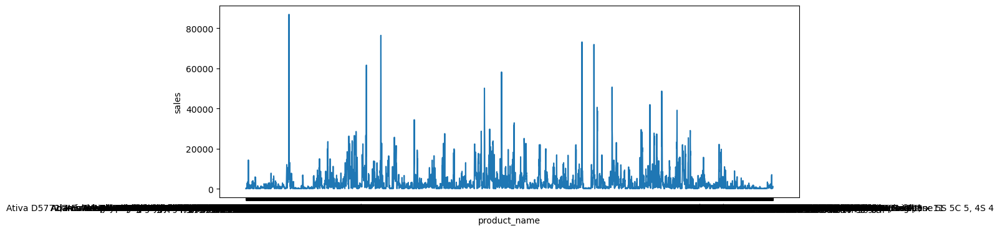

In [16]:
plt.figure(figsize=(12, 4))
sns.lineplot(data=sales_par_produit,x='product_name',y=sales_par_produit)
plt.show()

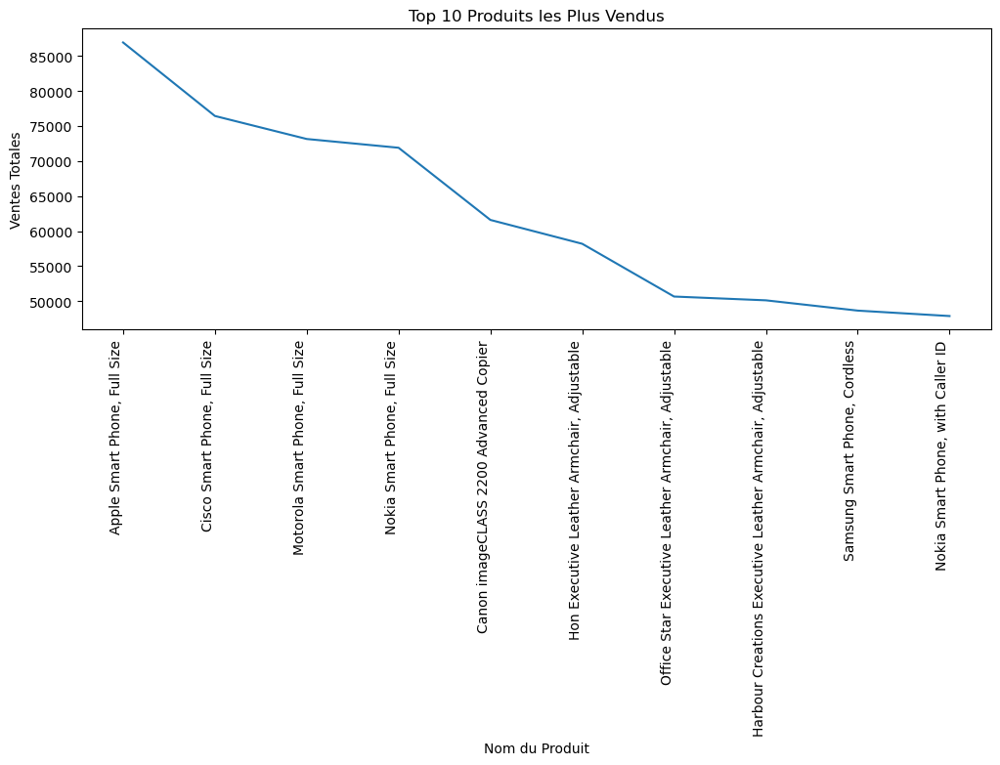

In [17]:
#Meme code que celui d'en haut avec seulement les 10 meilleurs ventes.

plt.figure(figsize=(12, 4))
sns.lineplot(data=ten_bests ,x='product_name',y=ten_bests)
plt.title('Top 10 Produits les Plus Vendus')
plt.xlabel('Nom du Produit')
plt.ylabel('Ventes Totales')
plt.xticks(rotation=90, ha='right')  # Rotation des noms des produits pour une meilleure lisibilité

plt.show()

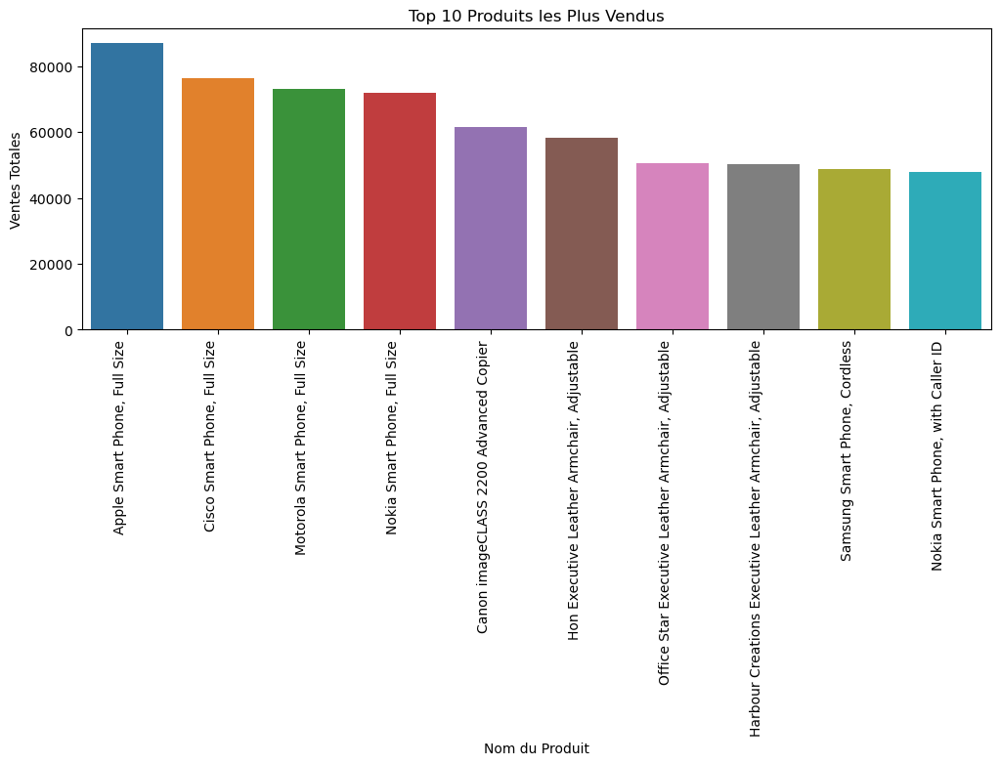

In [18]:
df_ten_bests = pd.DataFrame({'values': ten_bests}) #Transformation de la serie en dataframe

plt.figure(figsize=(12, 4))
sns.barplot(data=df_ten_bests, x=df_ten_bests.index, y='values')
plt.title('Top 10 Produits les Plus Vendus')
plt.xlabel('Nom du Produit')
plt.ylabel('Ventes Totales')
plt.xticks(rotation=90, ha='right')  # Rotation des noms des produits pour une meilleure lisibilité

plt.show()

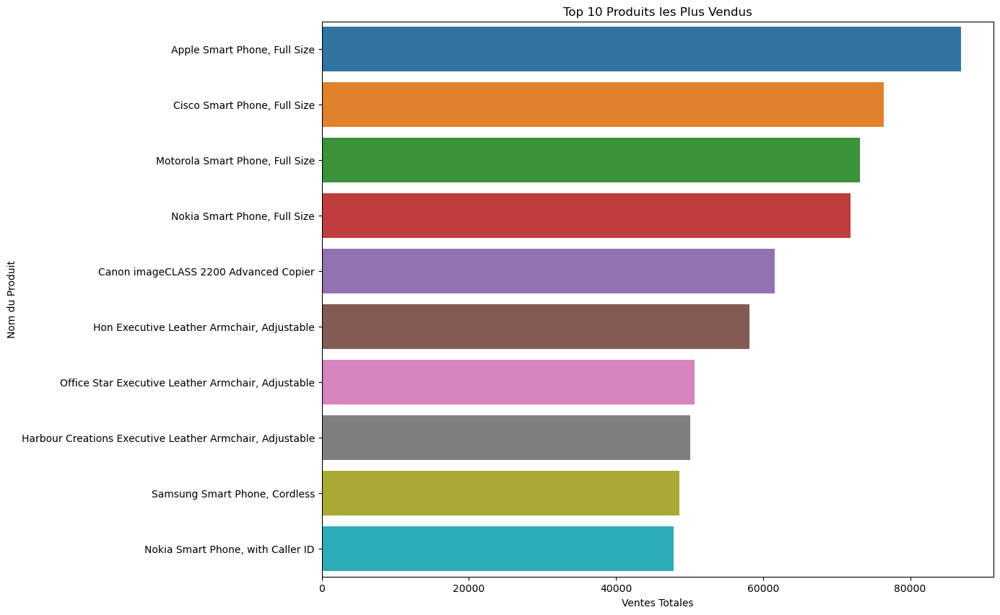

In [19]:
#Version horizontale

plt.figure(figsize=(12, 10))
sns.barplot(data=df_ten_bests, y=df_ten_bests.index, x='values')
plt.title('Top 10 Produits les Plus Vendus')
plt.ylabel('Nom du Produit')
plt.xlabel('Ventes Totales')

plt.show()

In [20]:
#df.hist()

In [21]:
#plt.rcParams["figure.figsize"]=[10,3]
#sns.barplot(x="year",y="quantity",data=df)

In [22]:
#On regroupe les produits par leurs noms et on fait la somme des quantités vendues
ventes_par_produit = df.groupby('product_name')['quantity'].sum()

In [23]:
ventes_par_produit

product_name
"While you Were Out" Message Book, One Form per Page                                                    8
#10 Gummed Flap White Envelopes, 100/Box                                                               11
#10 Self-Seal White Envelopes                                                                          10
#10 White Business Envelopes,4 1/8 x 9 1/2                                                             32
#10- 4 1/8" x 9 1/2" Recycled Envelopes                                                                37
                                                                                                       ..
iKross Bluetooth Portable Keyboard + Cell Phone Stand Holder + Brush for Apple iPhone 5S 5C 5, 4S 4    24
iOttie HLCRIO102 Car Mount                                                                             12
iOttie XL Car Mount                                                                                    14
invisibleSHIELD by ZAGG Smudge-Fr

In [24]:
#Le produit le plus vendu
ventes_par_produit.idxmax()

'Staples'

In [25]:
#Vérification du résultat
ventes_par_produit['Staples']

876

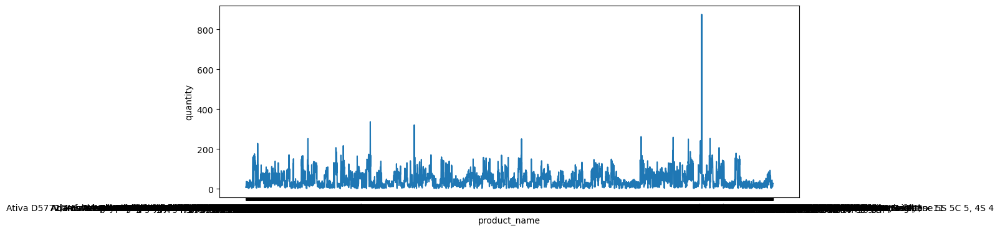

In [26]:
#On essaye de représenter les ventes(quantités) par rapport aux produits
#Il y'a trop de produits pour que le graphique soit compréhensible 
#On remarque quand même qu'il y a un produit largement plus vendu que les autres
plt.figure(figsize=(12, 4))
sns.lineplot(data=ventes_par_produit,x='product_name',y=ventes_par_produit)
plt.show()

In [27]:
#Les 10 produits les plus vendus en terme de quantité
ten_bests_quantity=ventes_par_produit.nlargest(10)
ten_bests_quantity

product_name
Staples                                  876
Cardinal Index Tab, Clear                337
Eldon File Cart, Single Width            321
Rogers File Cart, Single Width           262
Sanford Pencil Sharpener, Water Color    259
Stockwell Paper Clips, Assorted Sizes    253
Avery Index Tab, Clear                   252
Ibico Index Tab, Clear                   251
Smead File Cart, Single Width            250
Stanley Pencil Sharpener, Water Color    242
Name: quantity, dtype: int64

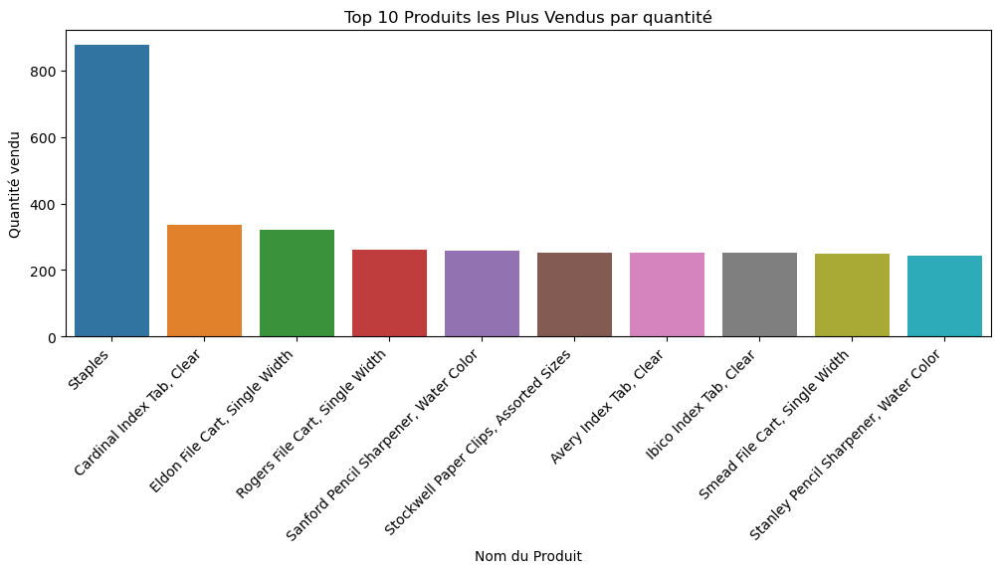

In [28]:
df_ten_bests_quantity = pd.DataFrame({'values': ten_bests_quantity}) #Transformation de la serie en dataframe

plt.figure(figsize=(12, 4))
sns.barplot(data=df_ten_bests_quantity, x=df_ten_bests_quantity.index, y='values')
plt.title('Top 10 Produits les Plus Vendus par quantité')
plt.xlabel('Nom du Produit')
plt.ylabel('Quantité vendu')
plt.xticks(rotation=45, ha='right')  # Rotation des noms des produits pour une meilleure lisibilité

plt.show()

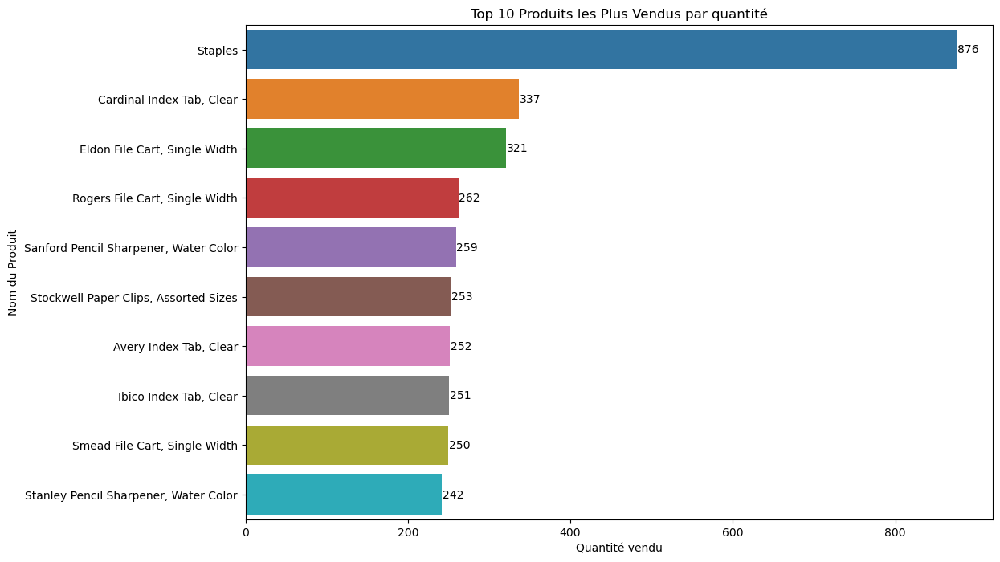

In [29]:
#Version horizontale

plt.figure(figsize=(12, 8))
graph_ten_best_q = sns.barplot(data=df_ten_bests_quantity, y=df_ten_bests_quantity.index, x='values')
plt.title('Top 10 Produits les Plus Vendus par quantité')
plt.ylabel('Nom du Produit')
plt.xlabel('Quantité vendu')

#Les valeurs indiquées a droite des barres
       
for p in graph_ten_best_q.patches:
    graph_ten_best_q.annotate('{:.0f}'.format(p.get_width()), 
                              (p.get_x() + p.get_width() + 0.4, p.get_y() + p.get_height() / 2), 
                              ha='left', va='center',color='black') 


plt.show()

In [30]:
#Les fréquences des différentes modalités de la variable ship_mode
#On voit que standard class est de loin le plus utilisé
df['ship_mode'].value_counts()

ship_mode
Standard Class    30775
Second Class      10309
First Class        7505
Same Day           2701
Name: count, dtype: int64

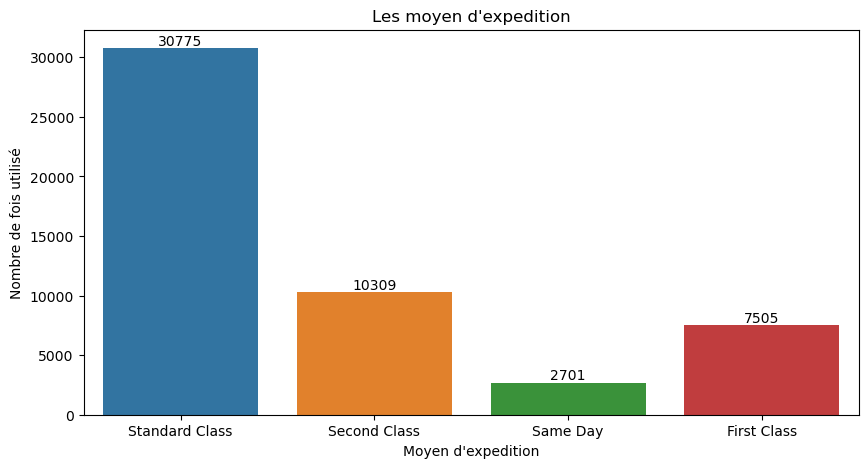

In [31]:
plt.figure(figsize=(10, 5))
graph_ship = sns.countplot(data=df, x="ship_mode")
plt.title("Les moyen d'expedition")
plt.xlabel("Moyen d'expedition")
plt.ylabel('Nombre de fois utilisé')

#Les valeurs indiquées au-dessus des barres
for p in graph_ship.patches:
        graph_ship.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')

plt.show()

In [32]:
#df['ship_mode'].unique()

In [33]:
#On regroupe les profits par catégorie et on fait la somme des profits
profit_par_category = df.groupby('category')['profit'].sum()

In [34]:
#On voit que la catégorie qui génère le plus de bénéfice est technology, mais office supplies n'est pas très loin
profit_par_category

category
Furniture          286782.25380
Office Supplies    518473.83430
Technology         663778.73318
Name: profit, dtype: float64

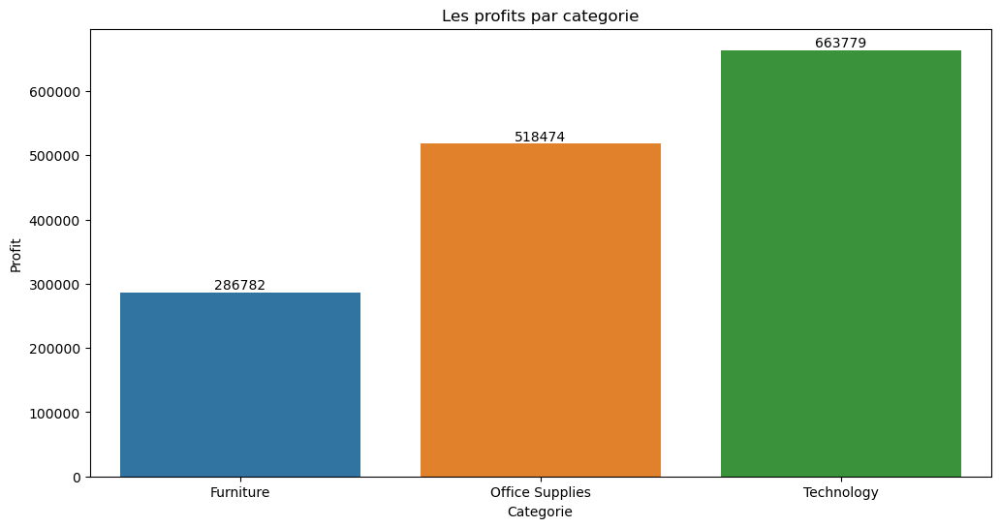

In [35]:
#Visualisation des profit pare categorie


df_profit_par_category = pd.DataFrame({'values': profit_par_category}) #Transformation de la serie en dataframe

plt.figure(figsize=(12, 6))
graph_cat = sns.barplot(data=df_profit_par_category, x=df_profit_par_category.index, y='values')
plt.title('Les profits par categorie')
plt.xlabel('Categorie')
plt.ylabel('Profit')

#Les valeurs indiquées au-dessus des barres
for p in graph_cat.patches:
        graph_cat.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')

In [36]:
profit_par_scategory = df.groupby('sub_category')['profit'].sum()

In [37]:
profit_par_scategory

sub_category
Accessories    129626.30620
Appliances     141680.58940
Art             57953.91090
Binders         72449.84600
Bookcases      161924.41950
Chairs         141973.79750
Copiers        258567.54818
Envelopes       29601.11630
Fasteners       11525.42410
Furnishings     46967.42550
Labels          15010.51200
Machines        58867.87300
Paper           59207.68270
Phones         216717.00580
Storage        108461.48980
Supplies        22583.26310
Tables         -64083.38870
Name: profit, dtype: float64

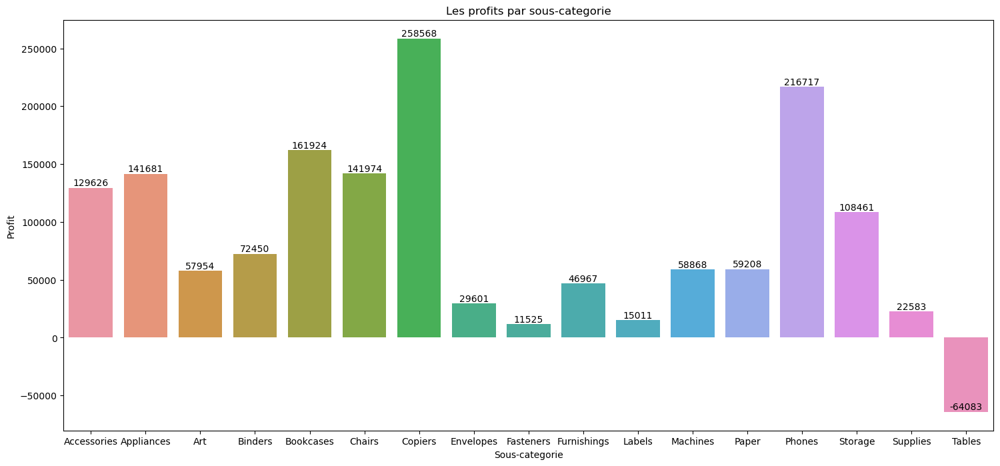

In [38]:
#Visualisation des profit par sous-categorie

df_profit_par_scategory = pd.DataFrame({'values': profit_par_scategory}) #Transformation de la serie en dataframe

plt.figure(figsize=(18, 8))
graph_scat = sns.barplot(data=df_profit_par_scategory, x=df_profit_par_scategory.index, y='values')
plt.title('Les profits par sous-categorie')
plt.xlabel('Sous-categorie')
plt.ylabel('Profit')

#Les valeurs indiquées au-dessus des barres
for p in graph_scat.patches:
        graph_scat.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')

In [39]:
#plt.boxplot(df['profit'],widths=25)

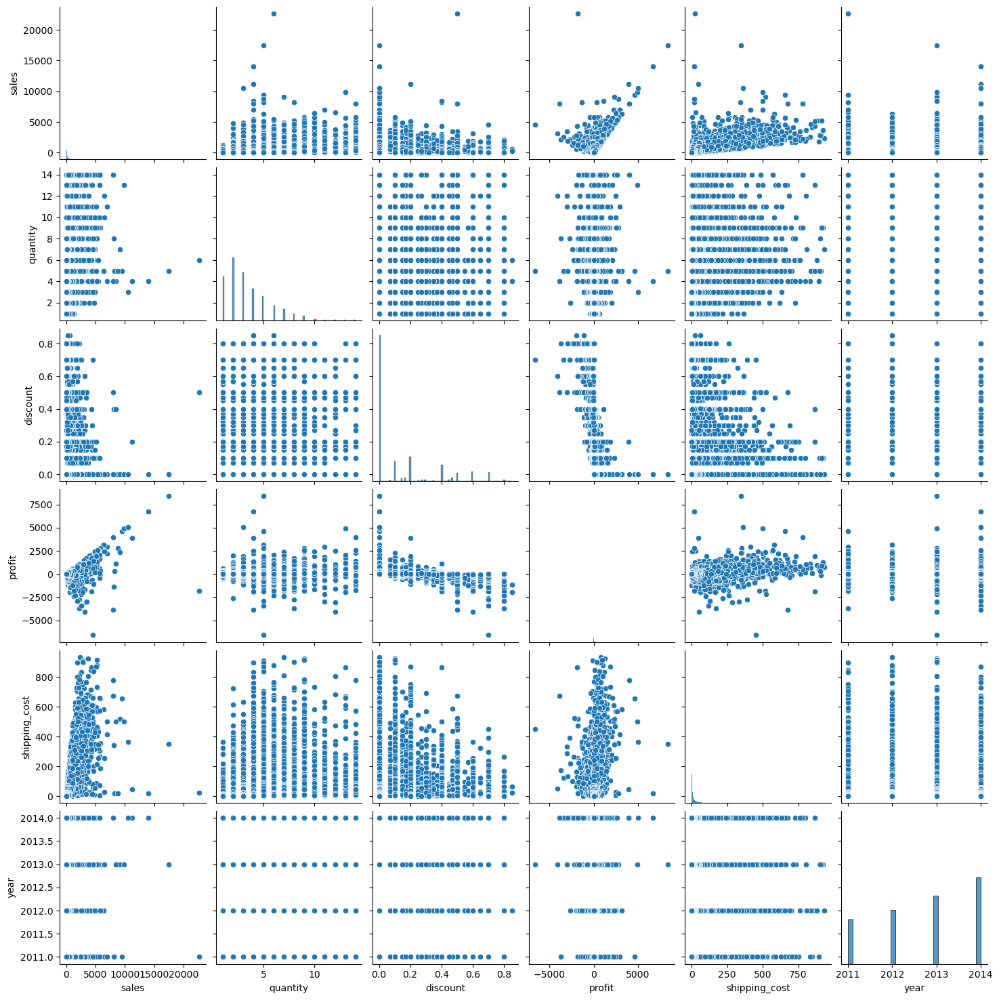

In [40]:
sns.pairplot(df)

#### On constate un lien entre le "profit" et "sales"; entre "profit" et "shipping_cost" (tres leger); entre "profit" et "discount"

In [41]:
import plotly.express as px
import plotly.graph_objs as go

In [42]:
fig = go.Figure(data=go.Box(y=df['profit'], boxpoints='all',marker=dict(outliercolor='red')))
fig.show()

In [43]:
#Boite a moustache de la variable profit

fig = px.box(df, y='profit',points='outliers')
fig.show()

In [44]:
#Pour avoir une idée des ventes a avec des pertes
#spoiler_alert: J'ai rien remarqué

df[df['profit'] <= -1000]

,order_id,order_date,ship_date,ship_mode,customer_name,segment,state,country,market,region,...,category,sub_category,product_name,sales,quantity,discount,profit,shipping_cost,order_priority,year
85,IT-2011-4546695,2011-01-08,2011-01-14,Standard Class,Darren Powers,Consumer,Midi-Pyrénées,France,EU,Central,...,Furniture,Bookcases,"Ikea Classic Bookcase, Metal",986.9040,6,0.60,-1011.6360,65.6400,Medium,2011
342,TU-2011-5460,2011-01-26,2011-01-31,Standard Class,Jay Fein,Consumer,Izmir,Turkey,EMEA,EMEA,...,Furniture,Chairs,"SAFCO Executive Leather Armchair, Adjustable",1113.4080,6,0.60,-1475.3520,47.3500,Medium,2011
1103,CA-2011-145317,2011-03-18,2011-03-23,Standard Class,Sean Miller,Home Office,Florida,United States,US,South,...,Technology,Machines,Cisco TelePresence System EX90 Videoconferenci...,22638.4800,6,0.50,-1811.0784,24.2865,Medium,2011
2677,TU-2011-6790,2011-06-07,2011-06-11,Standard Class,Michelle Tran,Home Office,Gaziantep,Turkey,EMEA,EMEA,...,Office Supplies,Appliances,"Hoover Stove, White",1359.8640,6,0.60,-1869.8760,83.9400,Medium,2011
3775,CA-2011-169019,2011-07-26,2011-07-30,Standard Class,Luke Foster,Consumer,Texas,United States,US,Central,...,Office Supplies,Binders,GBC DocuBind P400 Electric Binding System,2177.5840,8,0.80,-3701.8928,172.0700,Medium,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49630,US-2014-160591,2014-12-08,2014-12-14,Standard Class,Carol Adams,Corporate,Minas Gerais,Brazil,LATAM,South,...,Technology,Phones,"Samsung Smart Phone, Cordless",1192.8000,7,0.60,-1580.4600,121.2350,Medium,2014
50133,ES-2014-1406762,2014-12-15,2014-12-19,Standard Class,Kelly Andreada,Consumer,Champagne-Ardenne,France,EU,Central,...,Furniture,Chairs,"Novimex Executive Leather Armchair, Adjustable",1473.4080,8,0.60,-1694.5920,93.6400,High,2014
50433,NI-2014-5830,2014-12-19,2014-12-26,Standard Class,Juliana Krohn,Consumer,Lagos,Nigeria,Africa,Africa,...,Office Supplies,Appliances,"Breville Microwave, Red",724.1040,8,0.70,-1472.3760,27.3700,Medium,2014
50891,TU-2014-6470,2014-12-26,2014-12-28,Second Class,Jack Garza,Consumer,Ankara,Turkey,EMEA,EMEA,...,Furniture,Tables,"Bevis Round Table, Adjustable Height",1248.9120,6,0.60,-1779.7680,18.2800,High,2014


In [45]:
#df_neg est un dataframe ne contenant que les ligne ou il y'a des pertes

df_negative_profits = df[df['profit'] <= 0].copy()
df_negative_profits

,order_id,order_date,ship_date,ship_mode,customer_name,segment,state,country,market,region,...,category,sub_category,product_name,sales,quantity,discount,profit,shipping_cost,order_priority,year
3,IT-2011-3647632,2011-01-01,2011-01-05,Second Class,Eugene Moren,Home Office,Stockholm,Sweden,EU,North,...,Office Supplies,Paper,"Enermax Note Cards, Premium",44.8650,3,0.50,-26.0550,4.82,High,2011
8,ID-2011-80230,2011-01-03,2011-01-09,Standard Class,Ken Lonsdale,Consumer,Auckland,New Zealand,APAC,Oceania,...,Technology,Copiers,"Hewlett Wireless Fax, Laser",912.4560,4,0.40,-319.4640,107.10,Low,2011
10,IN-2011-65159,2011-01-03,2011-01-07,Second Class,Larry Blacks,Consumer,National Capital,Philippines,APAC,Southeast Asia,...,Office Supplies,Storage,"Tenex Lockers, Industrial",337.6395,3,0.45,-122.8005,33.75,High,2011
11,IN-2011-65159,2011-01-03,2011-01-07,Second Class,Larry Blacks,Consumer,National Capital,Philippines,APAC,Southeast Asia,...,Furniture,Tables,"Chromcraft Round Table, Adjustable Height",211.1805,1,0.55,-70.3995,21.32,High,2011
14,ID-2011-80230,2011-01-03,2011-01-09,Standard Class,Ken Lonsdale,Consumer,Auckland,New Zealand,APAC,Oceania,...,Furniture,Chairs,"Hon Rocking Chair, Set of Two",159.4440,2,0.40,-95.6760,10.07,Low,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51267,IT-2014-3715679,2014-12-31,2015-01-05,Second Class,Jim Kriz,Home Office,North Brabant,Netherlands,EU,Central,...,Office Supplies,Art,"BIC Pencil Sharpener, Fluorescent",30.2700,2,0.50,-9.6900,4.46,High,2014
51272,IT-2014-3715679,2014-12-31,2015-01-05,Second Class,Jim Kriz,Home Office,North Brabant,Netherlands,EU,Central,...,Office Supplies,Binders,"Avery Binder Covers, Recycled",22.8600,4,0.50,-6.4200,3.46,High,2014
51274,TU-2014-5170,2014-12-31,2015-01-04,Second Class,Valerie Dominguez,Consumer,Konya,Turkey,EMEA,EMEA,...,Technology,Accessories,"SanDisk Keyboard, Bluetooth",32.5920,1,0.60,-25.2780,3.40,Medium,2014
51275,ID-2014-54442,2014-12-31,2015-01-04,Standard Class,Muhammed Yedwab,Corporate,National Capital,Philippines,APAC,Southeast Asia,...,Technology,Accessories,"Memorex Mouse, Bluetooth",61.9740,4,0.45,-37.2660,3.18,Medium,2014


### ANALYSE BIVARIEE: TARGET (profit) et les variables numériques continues 'sales' 'quantity' 'discount' et 'shipping_cost'

In [46]:
Cont_Var = [col for col in df.columns if (col not in 'year' and df[col].dtypes != 'O' and df[col].dtypes != 'datetime64[ns]')] 
print(Cont_Var)

['sales', 'quantity', 'discount', 'profit', 'shipping_cost']


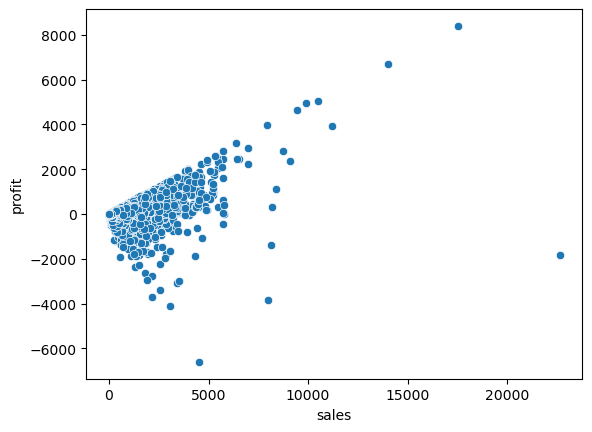

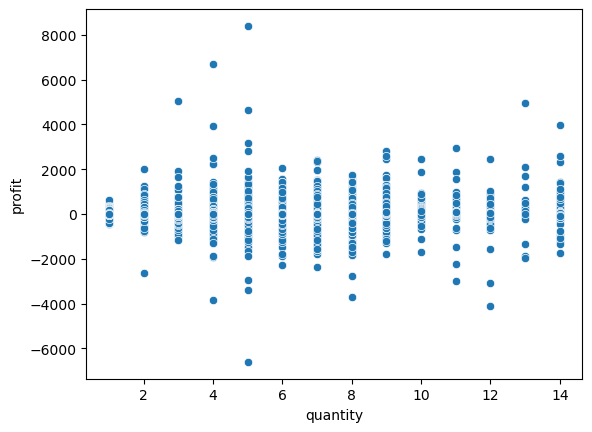

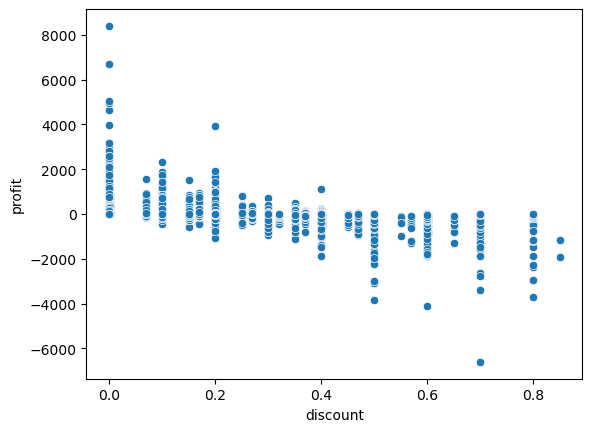

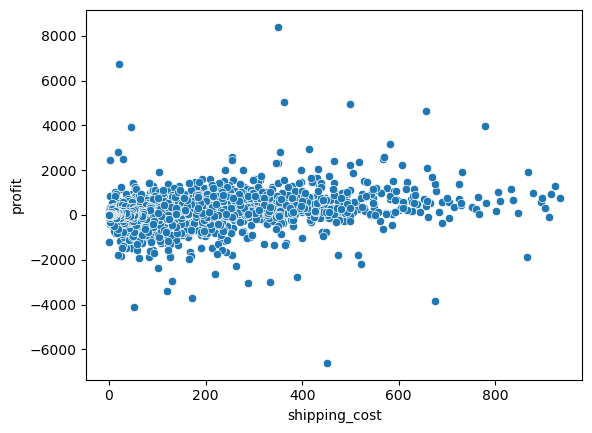

In [47]:
for col in Cont_Var:
    if col!='profit':
        plt.figure()
        sns.scatterplot(x=col,y='profit',data=df)

### ANALYSE BIVARIEE: TARGET ET VARIABLE CATEGORIELLE + NUMERIQUE DISCRETE

In [48]:
#Recuperation des variables categorielle

Cat_Var = [col for col in df.columns if (col not in Cont_Var and col not in 'order_id' and col not in 'order_date' 
                                        and col not in 'ship_date' and col not in 'customer_name' and col not in 'product_name') ]
print(Cat_Var)

['ship_mode', 'segment', 'state', 'country', 'market', 'region', 'product_id', 'category', 'sub_category', 'order_priority', 'year']


In [49]:
for col in df.columns:
    print(f'{col:-<50}{df[col].nunique()} éléments uniques')

order_id------------------------------------------25035 éléments uniques
order_date----------------------------------------1430 éléments uniques
ship_date-----------------------------------------1464 éléments uniques
ship_mode-----------------------------------------4 éléments uniques
customer_name-------------------------------------795 éléments uniques
segment-------------------------------------------3 éléments uniques
state---------------------------------------------1094 éléments uniques
country-------------------------------------------147 éléments uniques
market--------------------------------------------7 éléments uniques
region--------------------------------------------13 éléments uniques
product_id----------------------------------------10292 éléments uniques
category------------------------------------------3 éléments uniques
sub_category--------------------------------------17 éléments uniques
product_name--------------------------------------3788 éléments uniques
sales---

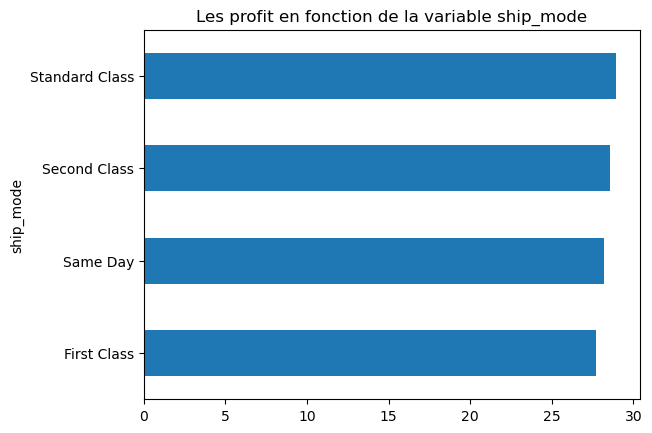

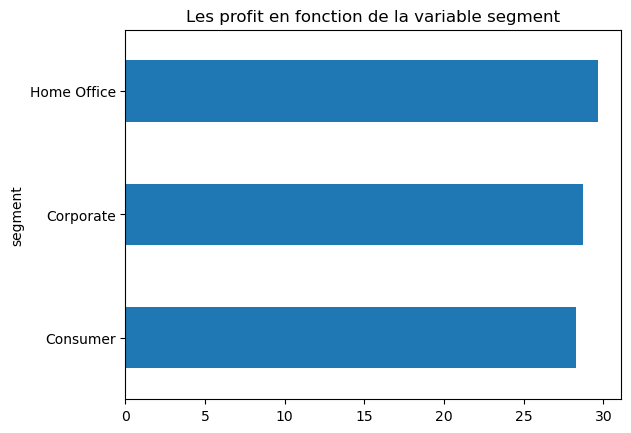

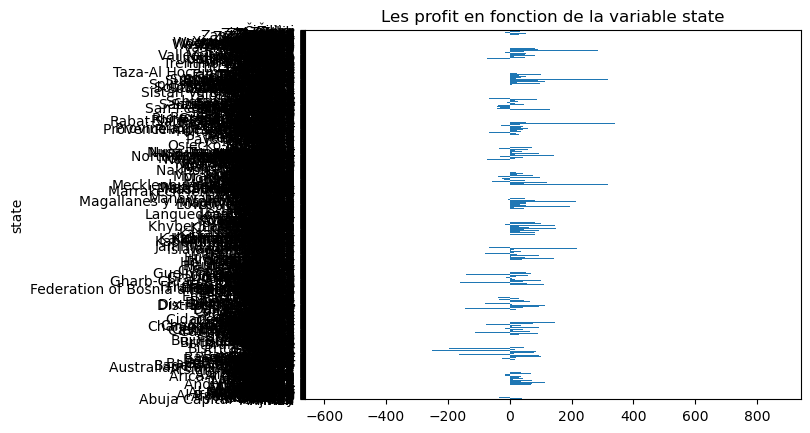

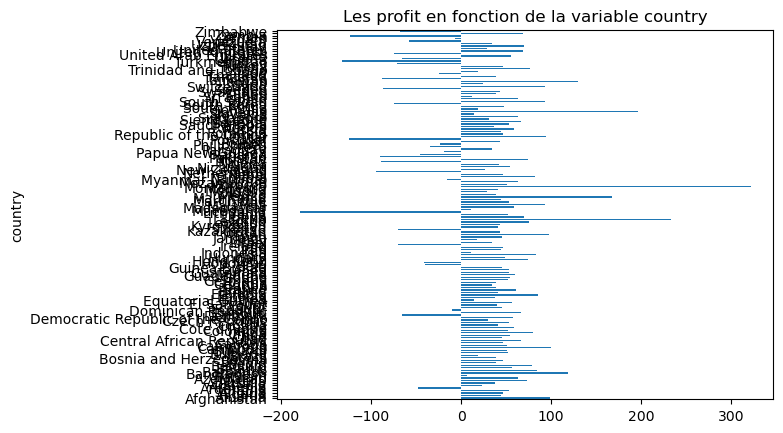

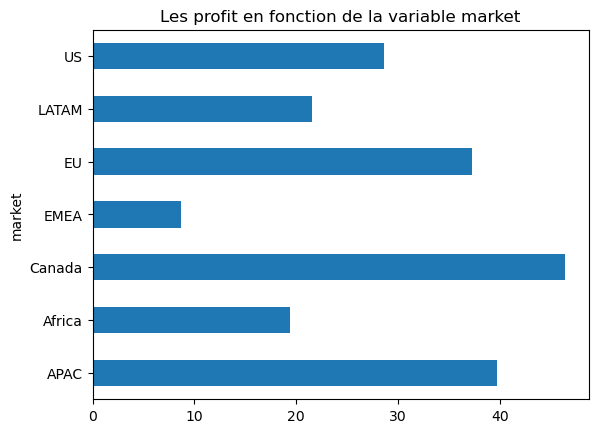

...

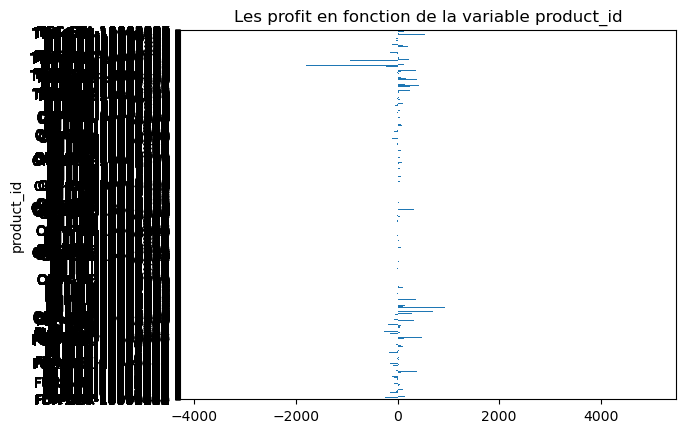

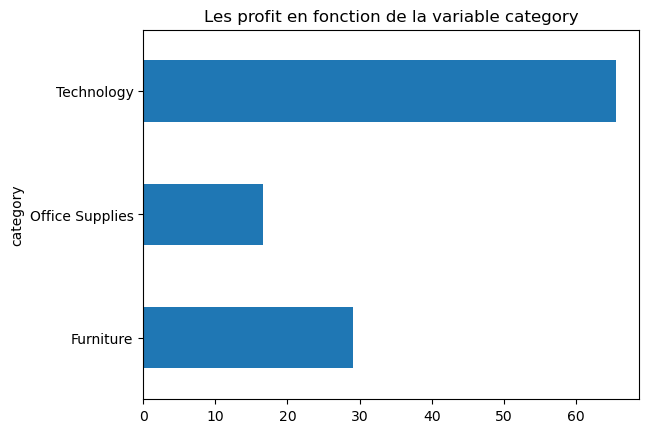

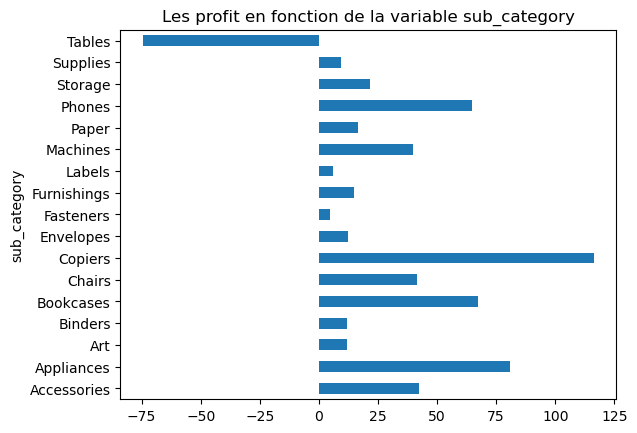

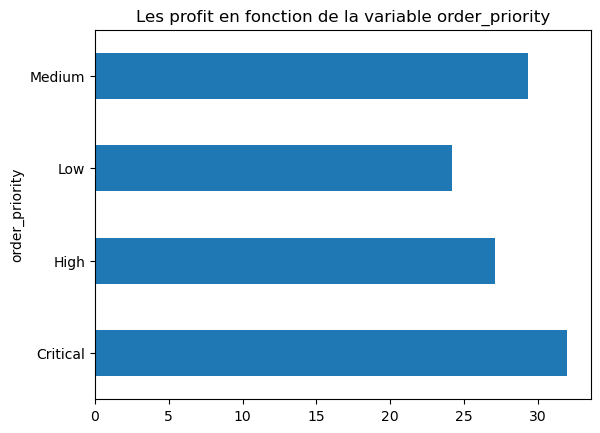

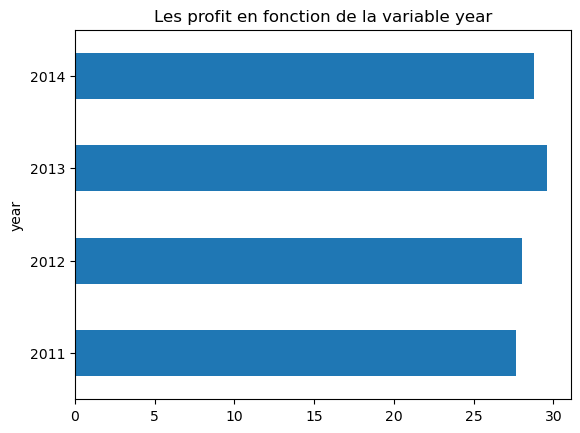

In [50]:
for col in Cat_Var:
    plt.figure()
    df.groupby(col)['profit'].mean().plot.barh()
    plt.title(f'Les profit en fonction de la variable {col}')
    plt.draw()

### 1-  Sur les variable "ship_mode", "segment", "order_priority" et "year" on constate rien de special. C'est equilibré

### 2 - On peut observer en moyenne des pertes sur certain elements de "states" et "country". Le nombre d'element etant trop consequant on refaira un autre graphe pour essayer de limiter le nombre et mieux visualiser.

### 3-On constate au niveau de le market "EMEA" est celui qui a fait le moins de profit

### 4-On constate que les "resgion" effectuant le moins de "profit" sont: southeast asia et EMEA

### 5 - Et comme observer precedenment, la "sub_categorie" : "table" est une categorie qui engendre des pertes

In [51]:
#Petit filtrage de Cat_var. La variable "product_id" a été retiré
Cat_Var2 = [col for col in df.columns if (col not in Cont_Var and col not in 'order_id' and col not in 'order_date' 
                                        and col not in 'ship_date' and col not in 'customer_name' 
                                         and col not in 'product_name'
                                        and col not in 'product_id') ]
print(Cat_Var2)

['ship_mode', 'segment', 'state', 'country', 'market', 'region', 'category', 'sub_category', 'order_priority', 'year']


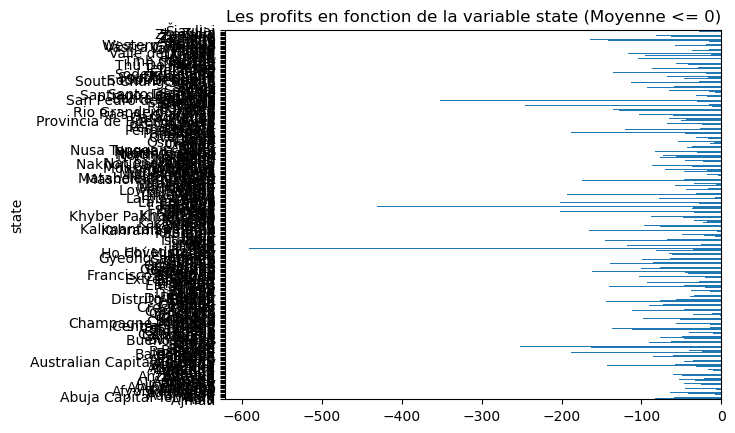

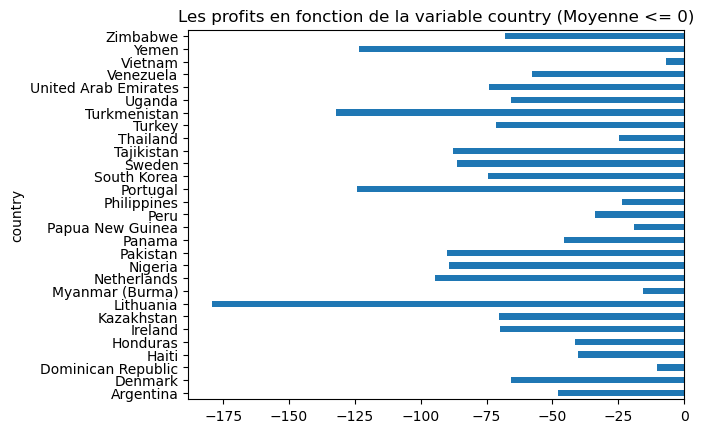

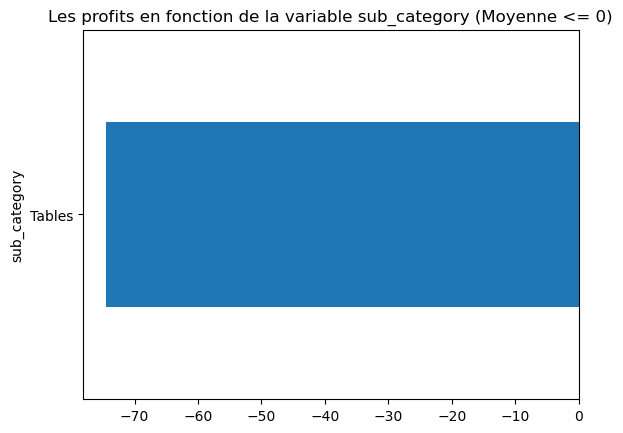

In [52]:
for col in Cat_Var2:
    # Calculer la moyenne des profits pour chaque catégorie
    mean_profit_by_variable = df.groupby(col)['profit'].mean()

    # Filtrer les catégories avec une moyenne inférieure ou égale à 0
    filtered_variables = mean_profit_by_variable[mean_profit_by_variable <= 0]

    # Vérifier s'il y a des catégories à afficher
    if not filtered_variables.empty:
        # Créer un graphique à barres horizontales pour les catégories filtrées
        plt.figure()
        filtered_variables.plot.barh()
        plt.title(f'Les profits en fonction de la variable {col} (Moyenne <= 0)')
        plt.show()

### 1- Nous poivons observer un liste assez explicite de "country" engendrant en moyenne des pertes. A premiere vu c'est pays n'ont aucun lien les un avec les autres. Par contre la variable "states" reste tjrs illisible, faute de trop d'element. 

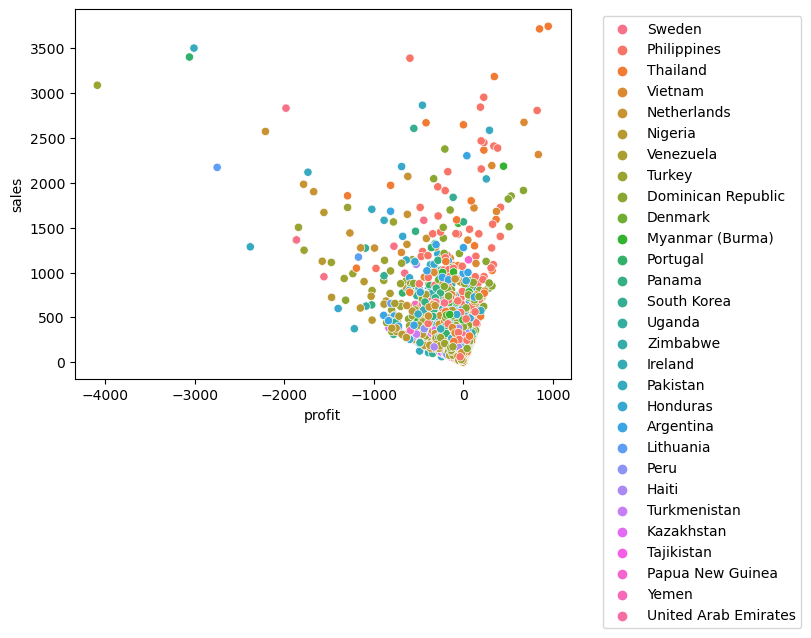

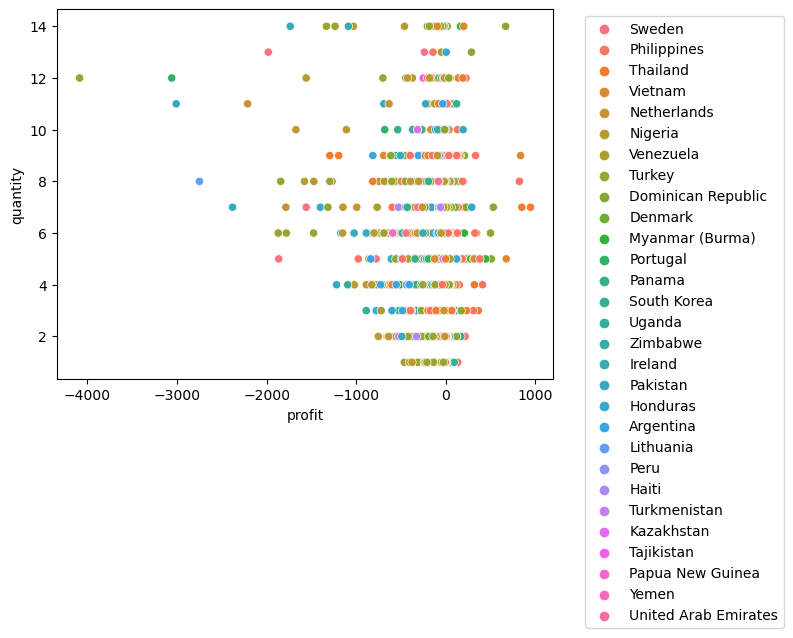

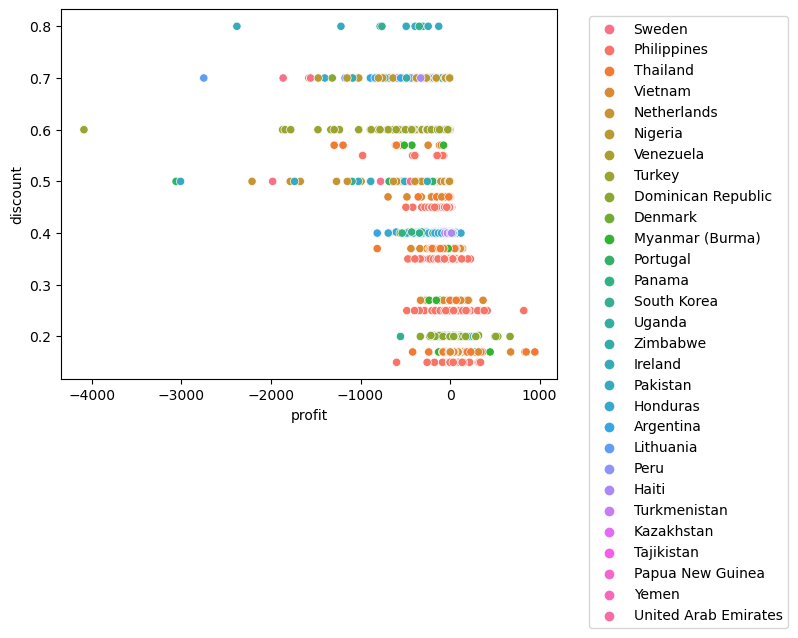

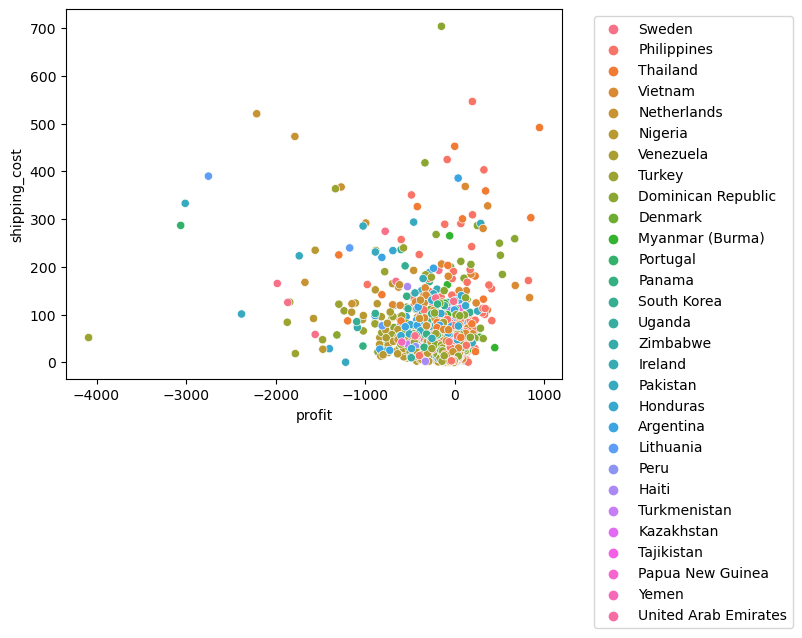

In [53]:
for col in Cont_Var:
    if col != 'profit':
        # Calculer la moyenne des profits par pays
        average_profit_by_country = df.groupby('country')['profit'].mean()

        # Filtrer les pays avec une moyenne de profit inférieure ou égale à 0
        countries_with_negative_profit = average_profit_by_country[average_profit_by_country <= 0].index

        # Filtrer le DataFrame original pour inclure uniquement les pays avec une moyenne de profit <= 0
        filtered_df = df[df['country'].isin(countries_with_negative_profit)]

        # Créer le graphique avec les pays filtrés
        plt.figure()
        sns.scatterplot(y=col, x='profit', data=filtered_df, hue='country')
        
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()

### ECHEC: Rien de bien interessant

In [54]:
for var in Cont_Var : 
    fig = px.box(df, y=var)
    fig.show()

rechercher qui a vendu le plus par ville ou par etat 

In [55]:
#Les pays(10) qui ont le plus de ventes

sales_par_country = df.groupby('country')['sales'].sum()
twenty_bests_country = sales_par_country.nlargest(10)
print(twenty_bests_country)

country
United States     2.297201e+06
Australia         9.252359e+05
France            8.589311e+05
China             7.005620e+05
Germany           6.288400e+05
Mexico            6.225906e+05
India             5.896501e+05
United Kingdom    5.285763e+05
Indonesia         4.048875e+05
Brazil            3.611064e+05
Name: sales, dtype: float64


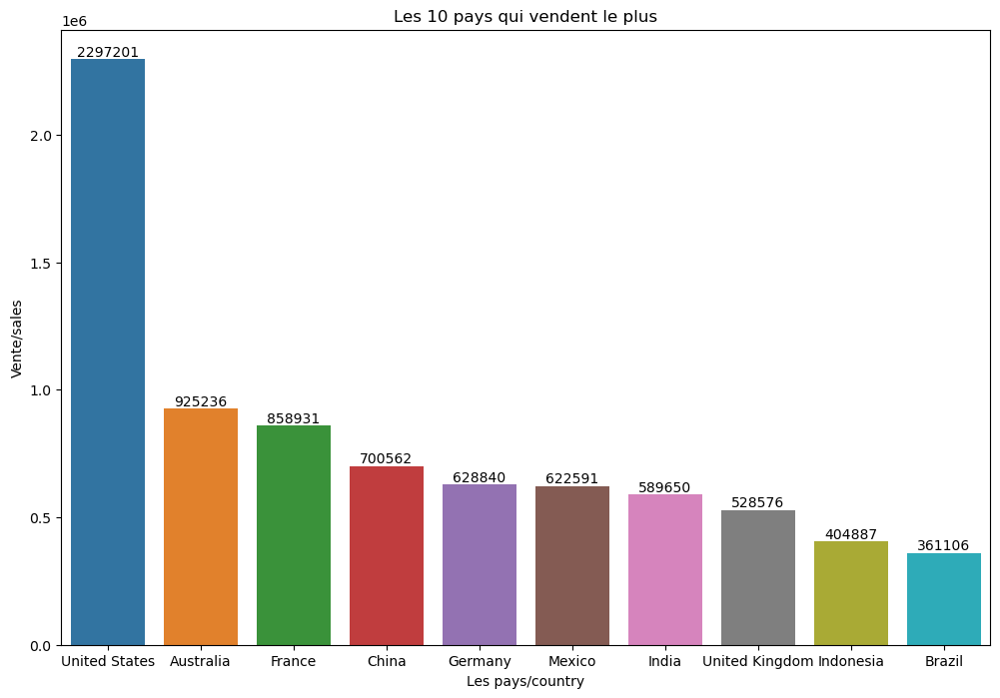

In [56]:
#Visualisation

df_sales_par_country = pd.DataFrame({'values': twenty_bests_country}) #Transformation de la serie en dataframe

plt.figure(figsize=(12, 8))
graph_sales_country = sns.barplot(data=df_sales_par_country, x=df_sales_par_country.index, y='values')
plt.title('Les 10 pays qui vendent le plus')
plt.xlabel('Les pays/country')
plt.ylabel('Vente/sales')

#Les valeurs indiquées au-dessus des barres
for p in graph_sales_country.patches:
        graph_sales_country.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')

In [57]:
#Les villes ou states(10) qui ont le plus de ventes

sales_par_state = df.groupby('state')['sales'].sum()
twenty_bests_state = sales_par_state.nlargest(10)
print(twenty_bests_state)

state
England                   485170.9710
California                457687.6315
Ile-de-France             317822.5440
New York                  310876.2710
New South Wales           270487.1040
Queensland                238312.7340
North Rhine-Westphalia    216451.8510
Texas                     170188.0458
San Salvador              153639.3970
National Capital          152175.3555
Name: sales, dtype: float64


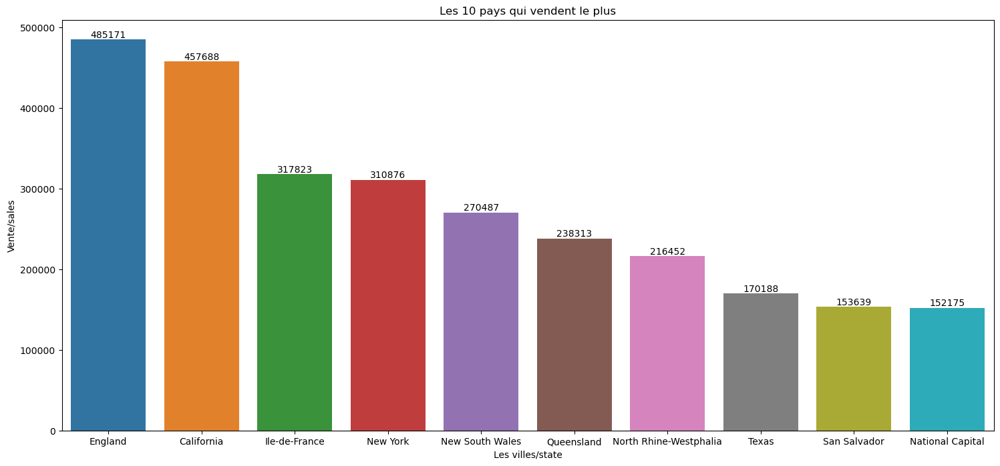

In [58]:
#Visualisation

df_sales_par_state = pd.DataFrame({'values': twenty_bests_state}) #Transformation de la serie en dataframe

plt.figure(figsize=(18, 8))
graph_sales_state = sns.barplot(data=df_sales_par_state, x=df_sales_par_state.index, y='values')
plt.title('Les 10 pays qui vendent le plus')
plt.xlabel('Les villes/state')
plt.ylabel('Vente/sales')

#Les valeurs indiquées au-dessus des barres
for p in graph_sales_state.patches:
        graph_sales_state.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')

In [59]:
#Les pays(10) qui ont le plus de profit

profit_par_country = df.groupby('country')['profit'].sum()
twenty_bests_country_profit = profit_par_country.nlargest(10)
print(twenty_bests_country_profit)

country
United States     286397.02170
China             150683.08500
India             129071.83500
United Kingdom    111900.15000
France            109029.00300
Germany           107322.82050
Australia         105484.96300
Mexico            102818.09752
Spain              54390.12000
El Salvador        42023.24320
Name: profit, dtype: float64


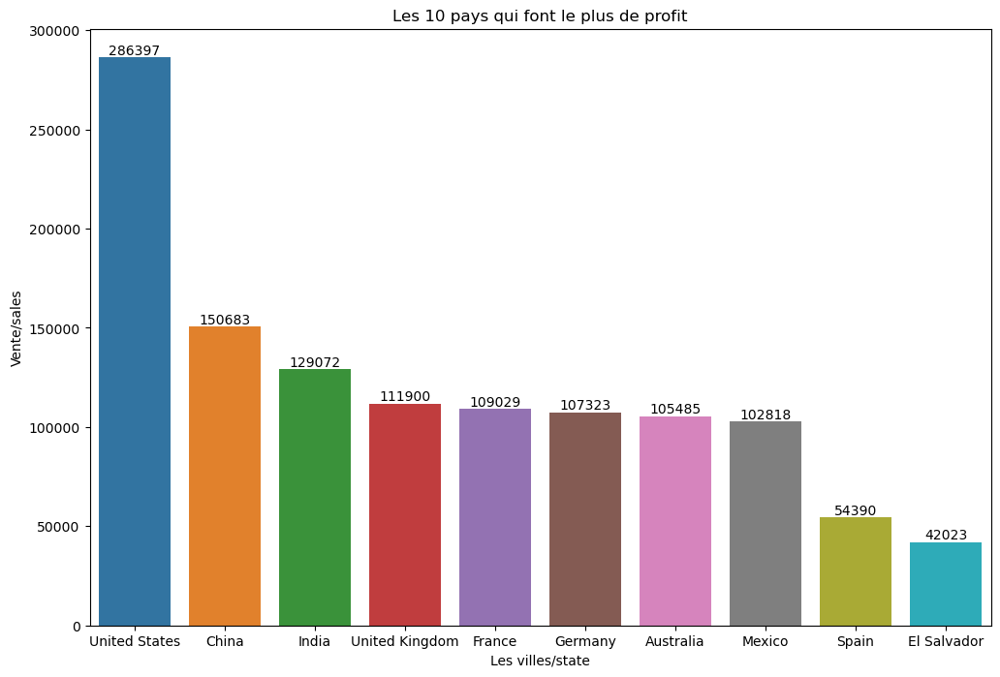

In [60]:
#Visualisation

df_profit_par_country = pd.DataFrame({'values': twenty_bests_country_profit}) #Transformation de la serie en dataframe

plt.figure(figsize=(12, 8))
graph_profit_country = sns.barplot(data=df_profit_par_country, x=df_profit_par_country.index, y='values')
plt.title('Les 10 pays qui font le plus de profit')
plt.xlabel('Les villes/state')
plt.ylabel('Vente/sales')

#Les valeurs indiquées au-dessus des barres
for p in graph_profit_country.patches:
        graph_profit_country.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')

In [61]:
#Les villes ou states(10) qui ont le plus de profit

profit_par_state = df.groupby('state')['profit'].sum()
twenty_bests_state_profit = profit_par_state.nlargest(10)
print(twenty_bests_state_profit)

state
England                   99907.73100
California                76381.38710
New York                  74038.54860
New South Wales           45273.51400
Ile-de-France             44055.92400
North Rhine-Westphalia    42347.87100
San Salvador              35883.37700
Washington                33402.65170
Michigan                  24463.18760
São Paulo                 21878.02388
Name: profit, dtype: float64


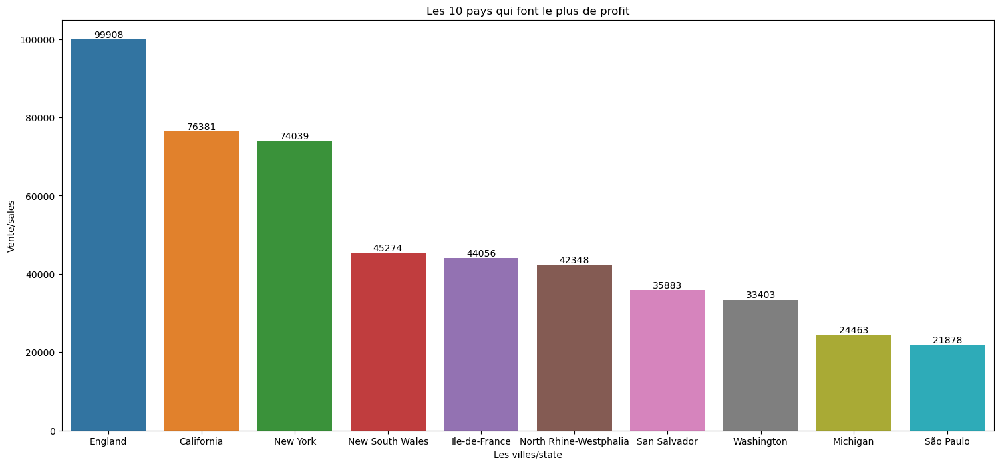

In [62]:
#Visualisation

df_profit_par_state = pd.DataFrame({'values': twenty_bests_state_profit}) #Transformation de la serie en dataframe

plt.figure(figsize=(18, 8))
graph_profit_state = sns.barplot(data=df_profit_par_state, x=df_profit_par_state.index, y='values')
plt.title('Les 10 pays qui font le plus de profit')
plt.xlabel('Les villes/state')
plt.ylabel('Vente/sales')

#Les valeurs indiquées au-dessus des barres
for p in graph_profit_state.patches:
        graph_profit_state.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')